# Map Zone Labelling

**Goals**:
- map zone labels
- remove some low quality cells

---

**ATTENTION**:
- mapping heppens for a single cell type: need to have all cells of a spefic cell type and get zone lebels for them (thus use a the corresponding cell type reference)
- Query must:
    - have same gene names --> "gene symbols" (not ensamble id)
    - be .h5ad
    - have raw counts in .X
- outputs
    - recomputed_stats.h5: Reference statistics per cell type
    - reference_markers.h5: Marker genes for reference cell types
q   - query_markers.json: Selected markers for query mapping ("markers useful for querying" not "based on a specific query dataset.")
    - **mapping_output.csv**: CSV table with:
        - Cell barcodes/IDs
        - Predicted cell type labels
        - Confidence/probability scores

The script to run mapmycell on this dataset works by:
- Computing statistics from a reference (annotated) dataset
- Finding marker genes
- Mapping query cells to reference cell types using those markers

In [ ]:
%load_ext autoreload
%autoreload 2


# MUST BE FIRST - before any imports from cell_type_mapper --> error if FromSpecifiedMarkersRunner run wiht GPU
import os
os.environ['CUDA_VISIBLE_DEVICES'] = ''

import pandas as pd
import scanpy as sc
import os
from dotenv import load_dotenv; load_dotenv()
import ipynbname
import shutil
import numpy as np
import matplotlib.pyplot as plt
import json
from tqdm.notebook import tqdm
import subprocess
import shutil
from scipy import sparse
import seaborn as sns

from utils import preprocessing


BASE_PATH = os.getenv("BASE_PATH_FOR_SAVING")

# Can be chnaged
DISEASE_TYPE = "diseased" # diseased / healthy
SAMPLE_ID = "recon_241105" #"sample_01" #"recon_241105"
ADATA_PATH = f'{BASE_PATH}/{DISEASE_TYPE}/{SAMPLE_ID}/adata/all_lib_adata_cell_type_MSN_QCed.h5ad' #"/home/gdallagl/myworkdir/XDP/data/XDP/diseased/recon_241105/FAKE_BCL/FAKE_LIBRARY/adata/reprocessed_filtered_adata.h5ad" #f'{BASE_PATH}/{DISEASE_TYPE}/{SAMPLE_ID}/adata/all_lib_adata.h5ad'

# Fixed
MAPPING_OUTPUT_FOLDER =  f'{BASE_PATH}/{DISEASE_TYPE}/{SAMPLE_ID}/zoning'
FINAL_ADATA_PATH = f"{BASE_PATH}/{DISEASE_TYPE}/{SAMPLE_ID}/adata/all_lib_adata_zoned.h5ad"

ZONE_LABELLING_SCRIPT = os.getenv("ZONE_LABELLING_SCRIPT") # bash script that maps
ZONE_LABELLING_REFERENCES_FOLDER = os.getenv("ZONE_LABELLING_REFERENCES_FOLDER") # where the bican refecnes for zone mapping are stored
ZONE_LABELLING_STAT_FOLDER = f"{ZONE_LABELLING_REFERENCES_FOLDER}/stats" # temp folder to save stast needed for mapping --> SAVED IN REFERECE FOLDER (NTO CHANGE)

# obs col in the refereces adata that contains the zone labels for mappign
ZONE_LABELS_COL_NAME_IN_REF = "Final_Zone_Assignments_No_Smooth" #ATTENTION: must be the same of the mapping scirpt

# cell classigcation in .json to use as gourping  for mapping 
CT_GROUPING_TO_MAP = "mapping_coupling_for_zoning"

OBS_COL_ZONE = "zone" # col where zone will be saved

In [ ]:
# ONLY IF YOU WANT TO SPECIFIY

if False:
    ADATA_PATH = f"/home/gdallagl/myworkdir/XDP/data/XDP/NucSec/adatas/Striatum/Striatum_combined_QC_mmc_ct-cured.h5ad"
    FINAL_ADATA_PATH = f"{os.path.splitext(ADATA_PATH)[0]}_zoned.h5ad"
    print(FINAL_ADATA_PATH)

    # paths to files where mapping output will be written
    MAPPING_OUTPUT_FOLDER = f"{os.path.split(ADATA_PATH)[0]}/zoning"
    os.makedirs(MAPPING_OUTPUT_FOLDER, exist_ok=True)

    # ATTENTION
    # query must hae raw counts in .X
    # var MUST have a col "gene_symbol" with the gene symbols (not ensembl ids) --> SAME GENES NAMES OF REF!!!

    # ATTENTION; need speciufuc mapping
    # query.layers["counts"] = query.X.copy()
    # query.var["gene_symbol"] = query.var.index
    # import scipy.sparse as sp
    # query.X = sp.csr_matrix(query.shape)

# Only once: download and preprocess the adata reference for mapping

Need to have zone-mapping label col AND raw counts.

```bash
    # Downlaod locally
    gsutil -m cp  gs://macosko_data/leematth/sharing/all_types/*  . 
```

In [ ]:
# # Minimize adatas reference

# folder="/home/gdallagl/myworkdir/XDP/data/STR_zonation_references_h5ad"

# for path in [os.path.join(folder, f) for f in os.listdir(folder) if not os.path.isdir(os.path.join(folder, f))]:

#     print(path)

#     a = sc.read_h5ad(path)#, backed="r")
#     print(a)


#     # is raw counts
#     frac = np.count_nonzero(a.X.data % 1 != 0) #/ a.X.size
#     print("Fractional values ratio:", frac)

#     # has zone col
#     print("Has zone col: ", ZONE_LABELS_COL_NAME_IN_REF in list(a.obs.columns))

#     # Which value sin zone col
#     print("Zone Values: ", list(a.obs[ZONE_LABELS_COL_NAME_IN_REF].unique()))

#     adata_minimal = sc.AnnData(
#         X=sparse.csr_matrix(a.X),
#         obs=a.obs.copy(),
#         var=a.var.copy()
#     )

#     # Remove cells with Nan in zone col
#     adata_minimal = adata_minimal[~ adata_minimal.obs[ZONE_LABELS_COL_NAME_IN_REF].isna()]

#     # Check the gene neas to use
#     display(adata.var)

#     adata_minimal.write(path)

#     print("\n")

# del a, adata_minimal

# Load Query


In [ ]:
query = sc.read_h5ad(ADATA_PATH)
print(query)

assert "counts" in query.layers.keys(), "adata must have a layer named 'counts' with the raw counts for mapping"
assert "gene_symbol" in query.var.columns, "adata must have a var column named 'gene_symbol' with the gene symbols for mapping"

AnnData object with n_obs × n_vars = 126494 × 36190
    obs: 'total_counts', 'n_genes', 'logumi', 'pct_counts_mt', 'seurat_clusters', 'x', 'y', 'library', 'cell_class', 'cell_subclass', 'reclustered_patch_matrix_exotic', 'has_spatial', 'Neighborhood_label', 'Neighborhood_name', 'Neighborhood_bootstrapping_probability', 'Neighborhood_aggregate_probability', 'Neighborhood_correlation_coefficient', 'Class_label', 'Class_name', 'Class_bootstrapping_probability', 'Class_aggregate_probability', 'Class_correlation_coefficient', 'Subclass_label', 'Subclass_name', 'Subclass_bootstrapping_probability', 'Subclass_aggregate_probability', 'Subclass_correlation_coefficient', 'Group_label', 'Group_name', 'Group_bootstrapping_probability', 'Group_aggregate_probability', 'Group_correlation_coefficient', 'Cluster_label', 'Cluster_name', 'Cluster_alias', 'Cluster_bootstrapping_probability', 'Cluster_aggregate_probability', 'Cluster_correlation_coefficient', 'pct_intronic', 'is_cell', 'n_genes_by_counts',

In [ ]:
# Create spatial matrix with NaN by default
spatial_coords = np.full((query.n_obs, 2), np.nan)
# For cells with has_spatial == True, add their real coordinates
mask = query.obs['has_spatial'] == True
spatial_coords[mask] = query.obs.loc[mask, ['x', 'y']].values
# Assign to obsm
query.obsm['spatial'] = spatial_coords

### Add cell type groups for mapping


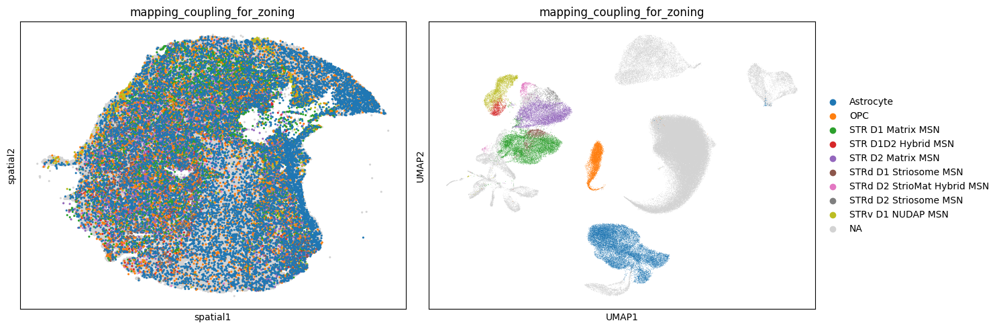

In [ ]:
# Load the JSON file
with open(os.getenv("GROUP_LEVEL_MMC_MAPPING_PATH"), 'r') as f:
    classifications = json.load(f)

schemes = [CT_GROUPING_TO_MAP]

for classification in schemes:
    # Filter out annotation entries (those with keys starting with "_
    clean_mapping = {
        k: v for k, v in classifications[classification].items() 
        if not k.startswith("_")
    }    
    # Apply classification
    query.obs[classification] = query.obs['Group_name'].map(clean_mapping)


for i, res in enumerate(schemes):

    fig, axes = plt.subplots(1, 2, figsize=(15, 5))

    sc.pl.embedding(query, basis="spatial", color=res, ax=axes[0], show=False, legend_loc=None, size=20, palette=sc.pl.palettes.vega_10  ) #     # First plot will generate colors and store them in adata.uns[f'{res}_colors']
    sc.pl.umap(query, color=res, ax=axes[1], show=False)#, legend_loc="on data") #    # Second plot will automatically use the same colors from adata.uns


    plt.tight_layout()
    plt.show()

# Define a cell type mapping

Each query cell type ("Group_name level) need to be mapped against the corresponding cell type in the referece (ie the name of the h5ad file used for mapping that cell type).

ATTENTION: multiple cell type can be mapped to the same referece cell type (h5ad file).

In reality the link is already created/writtein in the file `utils/STR_cell_types_annotation/group_level_mmc_mapping.json` in the col `mapping_coupling_for_zoning`.

Here we do not define the link (as alredy defined in that file), but write a dict where the:
- keys --> names cell types used for referece
- items --> keys with "_", ie the name to use for retrive the paths of the h5ad.

TO do this, we juts use the mapping in .json and add "_" in values.
ATTENTION: the keys are the referece adata names witiuhu "_".

In [ ]:
# Filter out annotation entries (those with keys starting with "_
CELL_TYPE_MAPPING = {
    v: v.replace(" ", "_") for k, v in classifications[CT_GROUPING_TO_MAP].items() 
    if not k.startswith("_")
}   

CELL_TYPE_MAPPING

{'STR D1 Matrix MSN': 'STR_D1_Matrix_MSN',
 'STR D2 Matrix MSN': 'STR_D2_Matrix_MSN',
 'STRd D1 Striosome MSN': 'STRd_D1_Striosome_MSN',
 'STRd D2 Striosome MSN': 'STRd_D2_Striosome_MSN',
 'STRv D1 NUDAP MSN': 'STRv_D1_NUDAP_MSN',
 'STR D1D2 Hybrid MSN': 'STR_D1D2_Hybrid_MSN',
 'STRd D2 StrioMat Hybrid MSN': 'STRd_D2_StrioMat_Hybrid_MSN',
 'OPC': 'OPC',
 'Astrocyte': 'Astrocyte'}

----

In [ ]:
# Initialise columns for resutls of mapping procedure
query.obs[OBS_COL_ZONE] = np.nan
query.obs[f"{OBS_COL_ZONE}_probability"] = np.nan
#query.obs[f"{OBS_COL_ZONE}_cell_type"] = np.nan

In [ ]:
!chmod +x {ZONE_LABELLING_SCRIPT}

In [ ]:
def plot_celltype_colored(adata, cell_type_col, cell_type_name, color_col, 
                          basis="spatial", size=20, ax=None, show=True, **kwargs):

    
    # Create temporary column for coloring
    temp_col = "_temp_color"
    
    # Initialize with NaN (will show as gray)
    # Initialize with proper dtype to avoid warning
    # Use object dtype to handle any type of data (categorical, numeric, etc.)
    adata.obs[temp_col] = pd.Series(np.nan, index=adata.obs.index, dtype=object)
    
    # Assign color values only for the specific cell type
    mask = adata.obs[cell_type_col] == cell_type_name
    adata.obs.loc[mask, temp_col] = adata.obs.loc[mask, color_col]

    # Convert  to categorical
    adata.obs[temp_col] = pd.Categorical(adata.obs[temp_col])
    
    # Plot
    ax = sc.pl.embedding(adata, basis=basis, color=temp_col, size=size, 
                         ax=ax, show=show, **kwargs)
    
    # Clean up temporary column
    adata.obs.drop(columns=[temp_col], inplace=True)
    
    return ax

In [ ]:
# Loop through each cell type
for CT_QUERY_NAME, CT_REFERENCE_NAME in CELL_TYPE_MAPPING.items():

    print(f"\n\n\n\n=== Mapping cell type: {CT_QUERY_NAME} using reference: {CT_REFERENCE_NAME} ===")

    ###########
    # 1. Set up paths (for this cell type)
    ###########

    # Define all paths
    working_folder = os.path.join(ZONE_LABELLING_STAT_FOLDER, CT_REFERENCE_NAME)
    output_folder = os.path.join(MAPPING_OUTPUT_FOLDER, CT_REFERENCE_NAME)
    ref_path = os.path.join(ZONE_LABELLING_REFERENCES_FOLDER, f"{CT_REFERENCE_NAME}.h5ad")
    query_path = os.path.join(working_folder, f"{CT_REFERENCE_NAME}.h5ad")

    # Create directories
    os.makedirs(output_folder, exist_ok=True)
    os.makedirs(working_folder, exist_ok=True)

    print(f"Reference:      {ref_path}")
    print(f"Query will be:  {query_path}")
    print(f"Working folder: {working_folder}")
    print(f"Final output:   {output_folder}")

    ###########
    # 2. Check if cells exist (skip if none)
    ###########

    if os.path.exists(ref_path) is False:
        print(f"\nReference file does not exist: {ref_path}. Skipping {CT_QUERY_NAME}.")
        continue   

    ###########
    # 3. Visualize cells to map
    ###########

    ###########
    # 4. Subset to cells of interest
    ###########

    # Visualize cells to map
    print(f"\nCell type to map: {CT_QUERY_NAME}")
    # sc.pl.embedding(query, basis="spatial", color=CT_GROUPING_TO_MAP,  # use grouping made by me
    #                 groups=[CT_QUERY_NAME], size=20, palette=["red"])

    # Subset to cells of interest
    print(f"\nSubsetting to {CT_QUERY_NAME} cells...")
    adata_ct = query[query.obs[CT_GROUPING_TO_MAP] == CT_QUERY_NAME].copy()
    print(f"  Found {adata_ct.n_obs} cells")


    ###########
    # 5. Create minimal AnnData
    ###########

    # Create minimal AnnData with only what's needed for mapping
    adata_minimal = sc.AnnData(
        X=adata_ct.layers["counts"],                      # Raw counts required
        obs=pd.DataFrame(index=adata_ct.obs_names),       # Just cell IDs
        var=pd.DataFrame(index=adata_ct.var["gene_symbol"])  # Gene symbols as index
    )

    # Save (need to save as the sh script needs it)
    adata_minimal.write(query_path)
    print(f"Saved to: {query_path}\n")

    ###########
    # 6. Verify reference
    ###########

    ref = sc.read_h5ad(ref_path, backed="r")

    # Has mapping col
    print(f"  Has '{ZONE_LABELS_COL_NAME_IN_REF}': {ZONE_LABELS_COL_NAME_IN_REF in ref.obs.columns}")
    if ZONE_LABELS_COL_NAME_IN_REF not in ref.obs.columns:
        print(f"\nATTENTION: Reference {ref_path} does not have zone labels in column '{ZONE_LABELS_COL_NAME_IN_REF}'. Skipping {CT_QUERY_NAME}.")
        continue

    # Check gene overlap
    query_genes = set(adata_ct.var["gene_symbol"])
    ref_genes = set(ref.var_names)
    overlap = len(query_genes.intersection(ref_genes)) / len(ref_genes)
    print(f"  Gene overlap: {overlap:.1%}\n")

    del ref

    ###########
    # 7. Run mapping script
    ###########

    cmd = [
        ZONE_LABELLING_SCRIPT,
        "-r", ref_path,
        "-q", query_path,
        "-o", working_folder,
        "-z", ZONE_LABELS_COL_NAME_IN_REF,
        #"-c" # Without -c: Do not recalculate the existing files, but the final mapping csv is recalucted 
    ]
        
    print("Running mapping script...")
    print(" ".join(cmd))

    result = subprocess.run(cmd, capture_output=True, text=True) # Waits for script to complete (blocks until done)

    # Print output
    if result.returncode != 0:
        print("ATTNETION: Mapping failed!")
        print(result.stderr)
        raise RuntimeError("Mapping script failed")

    print(result.stdout)
    print("Mapping complete")

    # Copy results to final folder
    print("\nCopying results...")
    
    shutil.copy2(
        os.path.join(working_folder, "mapping_output.csv"),
        os.path.join(output_folder, "mapping_output.csv")
    )
    shutil.copy2(
        os.path.join(working_folder, "mapping_output.json"),
        os.path.join(output_folder, "mapping_output.json")
    )

    print(f"Results saved to: {output_folder}")


    ###########
    # 8. Add labels to query
    ###########

    # Read mapping results
    mapping_df = pd.read_csv(
        os.path.join(output_folder, "mapping_output.csv"), 
        comment="#"
    )
    mapping_df.set_index("cell_id", inplace=True)

    print(f"Loaded mapping for {len(mapping_df)} cells")

    # Define source and target column names
    source_zone_col = f"{ZONE_LABELS_COL_NAME_IN_REF}_name" # defined in script
    source_prob_col = f"{ZONE_LABELS_COL_NAME_IN_REF}_bootstrapping_probability"

    target_zone_col = OBS_COL_ZONE  # "zone"
    target_prob_col = f"{OBS_COL_ZONE}_probability"  # "zone_probability"

    # Initialize columns if they don't exist
    if target_zone_col not in query.obs.columns:
        query.obs[target_zone_col] = np.nan
    if target_prob_col not in query.obs.columns:
        query.obs[target_prob_col] = np.nan

    # Find matching cells
    common_cells = query.obs_names.intersection(mapping_df.index)

    # Add zone labels
    query.obs.loc[common_cells, target_zone_col] = mapping_df.loc[common_cells, source_zone_col].values

    # Add probability scores
    query.obs.loc[common_cells, target_prob_col] = mapping_df.loc[common_cells, source_prob_col].values
    
    # Visualize results
    # plot_celltype_colored(query, CT_GROUPING_TO_MAP, CT_QUERY_NAME, "zone", basis="spatial")#, ax=axes[0], show=False)
    # plot_celltype_colored(query, CT_GROUPING_TO_MAP, CT_QUERY_NAME, "zone", basis="X_umap")#, ax=axes[0], show=False)

    #break

# Remove NaN values before finding max
valid_zones = query.obs[OBS_COL_ZONE].dropna()
# Give categories
query.obs[OBS_COL_ZONE] = pd.Categorical(
    query.obs[OBS_COL_ZONE].astype('Int64').astype(str),  # Use nullable Int64 to handle NaN
    categories=[str(i) for i in range(1, int(valid_zones.max()) + 1)],  # Fixed: max() + 1
    ordered=True
)





=== Mapping cell type: STR D1 Matrix MSN using reference: STR_D1_Matrix_MSN ===
Reference:      /home/gdallagl/myworkdir/data/STR_zonation_references_h5ad/STR_D1_Matrix_MSN.h5ad
Query will be:  /home/gdallagl/myworkdir/data/STR_zonation_references_h5ad/stats/STR_D1_Matrix_MSN/STR_D1_Matrix_MSN.h5ad
Working folder: /home/gdallagl/myworkdir/data/STR_zonation_references_h5ad/stats/STR_D1_Matrix_MSN
Final output:   /home/gdallagl/myworkdir/data/XDP/diseased/recon_241105/zoning/STR_D1_Matrix_MSN

Cell type to map: STR D1 Matrix MSN

Subsetting to STR D1 Matrix MSN cells...


  Found 7772 cells
Saved to: /home/gdallagl/myworkdir/data/STR_zonation_references_h5ad/stats/STR_D1_Matrix_MSN/STR_D1_Matrix_MSN.h5ad

  Has 'Final_Zone_Assignments_No_Smooth': True
  Gene overlap: 94.8%

Running mapping script...
/home/gdallagl/myworkdir/XDP/utils/STR_cell_types_annotation/run_mapmycells_zones.sh -r /home/gdallagl/myworkdir/data/STR_zonation_references_h5ad/STR_D1_Matrix_MSN.h5ad -q /home/gdallagl/myworkdir/data/STR_zonation_references_h5ad/stats/STR_D1_Matrix_MSN/STR_D1_Matrix_MSN.h5ad -o /home/gdallagl/myworkdir/data/STR_zonation_references_h5ad/stats/STR_D1_Matrix_MSN -z Final_Zone_Assignments_No_Smooth
/home/gdallagl/myworkdir/data/STR_zonation_references_h5ad
make output directory
Reference Directory: /home/gdallagl/myworkdir/data/STR_zonation_references_h5ad
Query Directory: /home/gdallagl/myworkdir/data/STR_zonation_references_h5ad/stats/STR_D1_Matrix_MSN/STR_D1_Matrix_MSN.h5ad
Output Directory: /home/gdallagl/myworkdir/data/STR_zonation_references_h5ad/stats/

# Create and save tmp query

<pre>
project/
│
├── ZONE_LABELLING_REFERENCES_FOLDER/
│   ├── ct_zoning_1.h5ad
│   ├── ct_zoning_2.h5ad
│   ├── ...
│   │
│   └── ZONE_LABELLING_STAT_FOLDER/
│       │
│       ├── ct_zoning_1/                      # Working directory per reference
│       │   ├── ct_mmc_*.h5ad                 # ⚠ Overwrites each run (Query h5ad)
│       │   ├── precomputed_stats.h5          # ✓ Reusable across queries (independent of query)
│       │   ├── reference_markers.h5          # ✓ Reusable across queries (independent of query)
│       │   ├── query_markers.json            # ✓ Reusable across queries (independent of query)
│       │   ├── mapping_output.csv            # ⚠ Overwrites each run (ie, the query is different but for this ct_zoning cell type)
│       │   └── mapping_output.json           # ⚠ Overwrites each run (ie, the query is different but for this ct_zoning cell type)
│       │
│       ├── ct_zoning_2/
│       │   └── ...
│       └── ...
│
└── MAPPING_OUTPUT_FOLDER/
    │
    ├── ct_mmc_1/                             # Final results per query cell type
    │   ├── mapping_output.csv                # ✓ Preserved copy
    │   └── mapping_output.json               # ✓ Preserved copy
    │
    ├── ct_mmc_2/
    │   ├── mapping_output.csv
    │   └── mapping_output.json
    └── ...

</pre>


# Save

In [ ]:
query.write(FINAL_ADATA_PATH)
FINAL_ADATA_PATH

'/home/gdallagl/myworkdir/XDP/data/XDP/NucSec/adatas/Striatum/Striatum_combined_QC_mmc_ct-cured_zoned.h5ad'

# Plot

ATTENTION: the zones even if called 1-6 for all cell types they have differnt spatial pattern for each cell type.

In [ ]:
query=sc.read_h5ad(FINAL_ADATA_PATH)

In [ ]:
MIN_CELLS_PER_DONOR = 50  # donors with fewer cells than this are excluded

for CT_QUERY_NAME, CT_REFERENCE_NAME in CELL_TYPE_MAPPING.items():
    print(f"\n\n\n\n=== Checking mapped cell type: {CT_QUERY_NAME} ===")
    
    adata_ct = query[query.obs[CT_GROUPING_TO_MAP] == CT_QUERY_NAME].copy()
    
    # Filter donors with too few cells
    donor_counts = adata_ct.obs['donor_id'].value_counts()
    valid_donors = donor_counts[donor_counts >= MIN_CELLS_PER_DONOR].index
    print(f"  Donors with >= {MIN_CELLS_PER_DONOR} cells: {len(valid_donors)} / {len(donor_counts)}")
    adata_ct = adata_ct[adata_ct.obs['donor_id'].isin(valid_donors)].copy()

    zone_props = (adata_ct.obs
        .groupby(['donor_id', OBS_COL_ZONE, 'condition'], observed=True)
        .size()
        .reset_index(name='count')
    )

    # Fill missing donor-zone combinations with 0
    all_donors = zone_props[['donor_id', 'condition']].drop_duplicates()
    all_zones = zone_props[[OBS_COL_ZONE]].drop_duplicates()
    full_index = all_donors.merge(all_zones, how='cross')

    zone_props = full_index.merge(zone_props, on=['donor_id', 'condition', OBS_COL_ZONE], how='left')
    zone_props['count'] = zone_props['count'].fillna(0)

    zone_props['proportion'] = (zone_props
        .groupby('donor_id')['count']
        .transform(lambda x: x / x.sum())
    )

    fig, ax = plt.subplots(figsize=(10, 5))
    sns.boxplot(data=zone_props, x=OBS_COL_ZONE, y='proportion', hue='condition', ax=ax)
    ax.set_title(f"Zone proportions for {CT_QUERY_NAME} (min {MIN_CELLS_PER_DONOR} cells/donor)")
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

In [ ]:
# Zone colors palette
size=20

palette_str = os.getenv("PALETTE")
palette = {int(k): v for k, v in json.loads(palette_str).items()}
palette

{1: '#9467bd',
 2: '#8c564b',
 3: '#2ca02c',
 4: '#d62728',
 5: '#1f77b4',
 6: '#ff7f0e'}

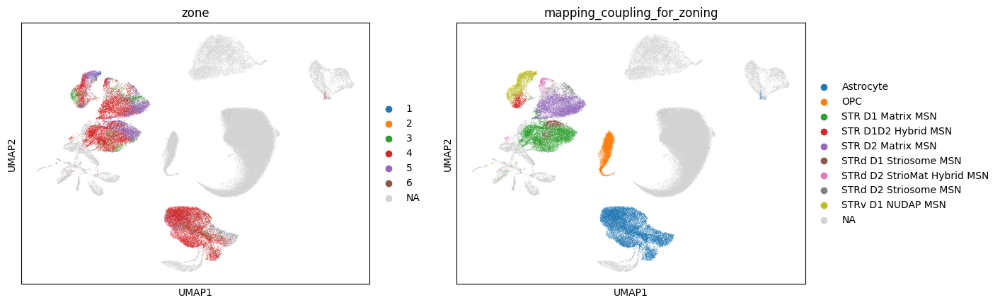

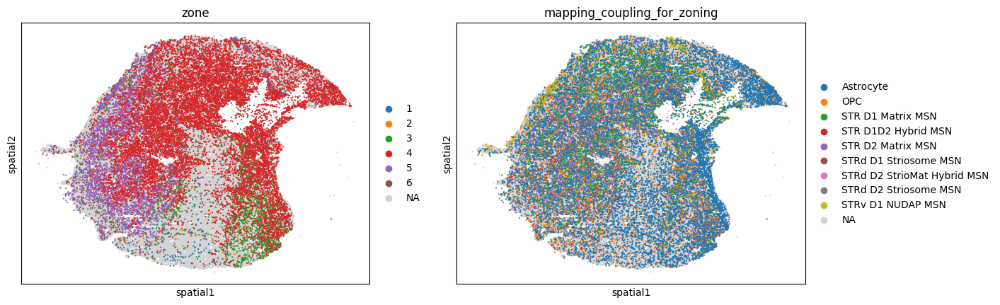

In [ ]:
sc.pl.umap(query, color=["zone", CT_GROUPING_TO_MAP])
sc.pl.embedding(query, basis="spatial", color=["zone", CT_GROUPING_TO_MAP], size=10)



=== Mapping cell type: STR D1 Matrix MSN using reference: STR_D1_Matrix_MSN ===

Subsetting to STR D1 Matrix MSN cells...
  Found 7772 cells


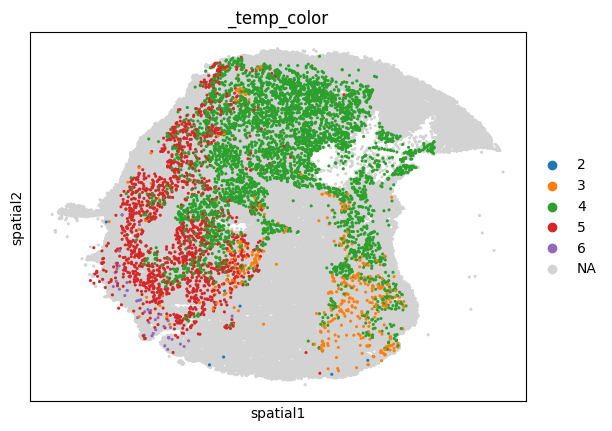

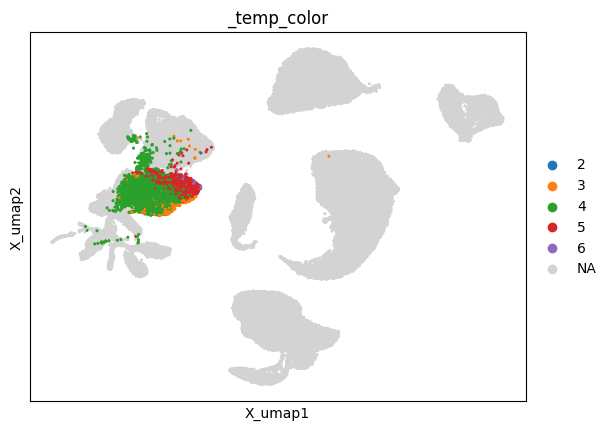

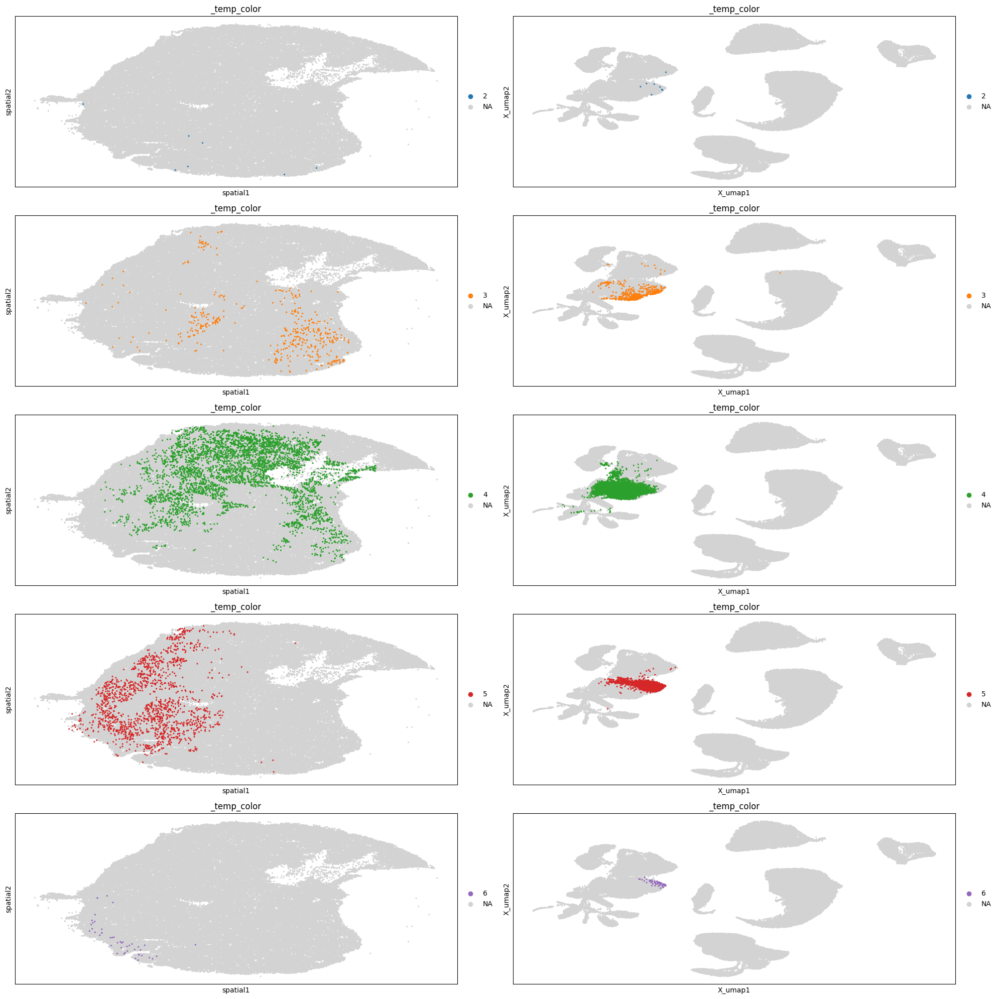



=== Mapping cell type: STR D2 Matrix MSN using reference: STR_D2_Matrix_MSN ===

Subsetting to STR D2 Matrix MSN cells...
  Found 5912 cells


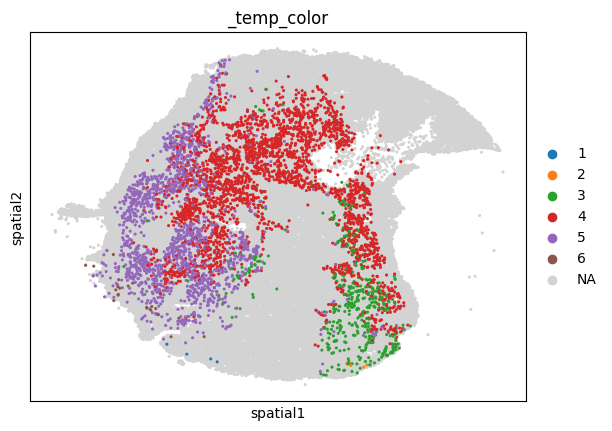

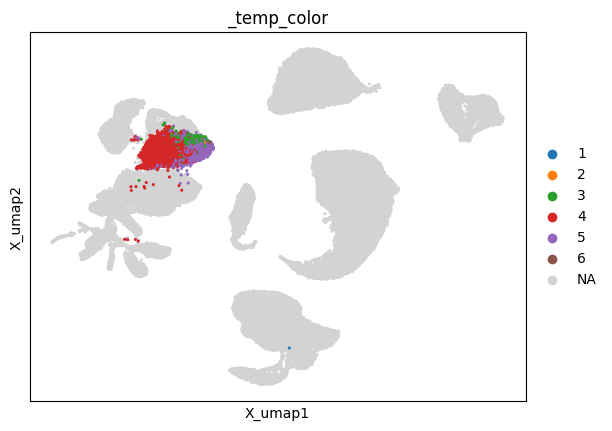

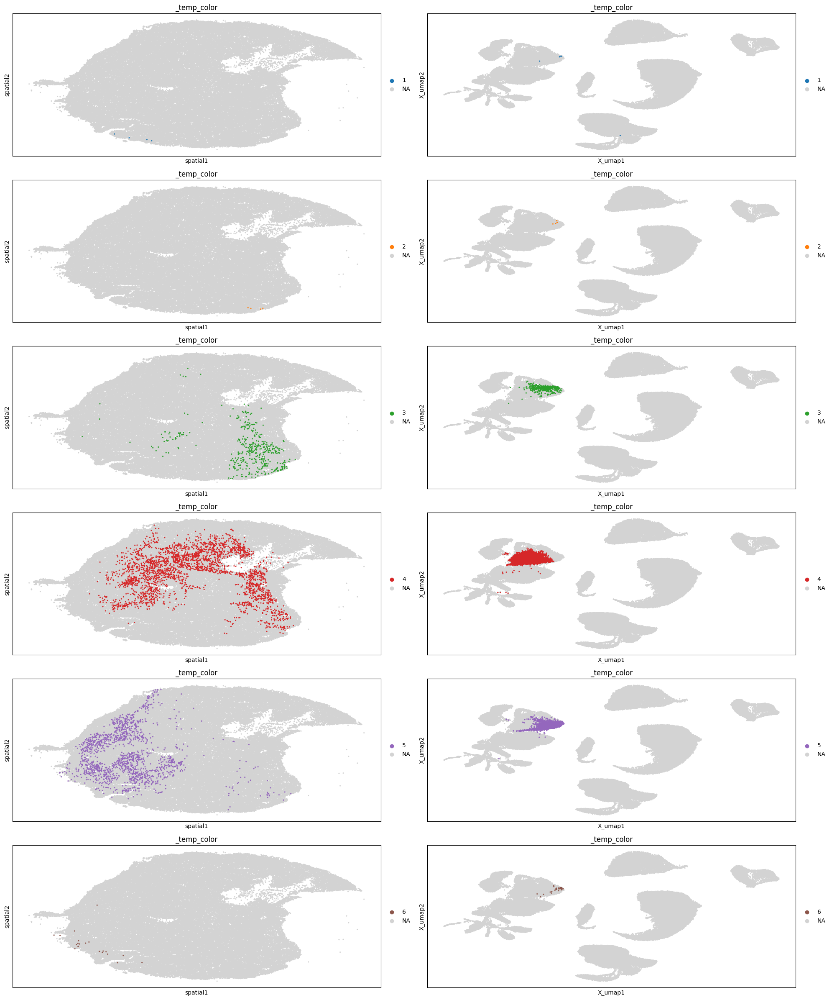



=== Mapping cell type: STRd D1 Striosome MSN using reference: STRd_D1_Striosome_MSN ===

Subsetting to STRd D1 Striosome MSN cells...
  Found 1085 cells


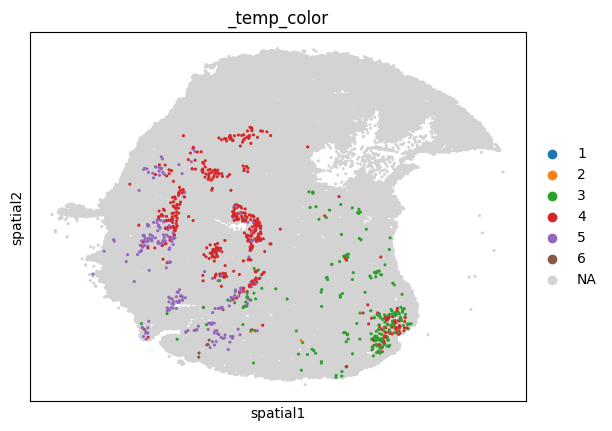

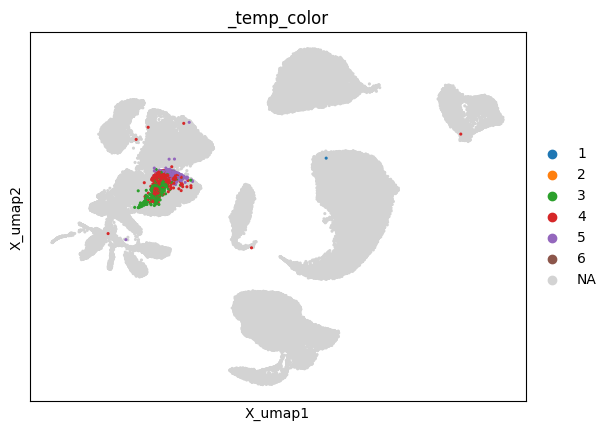

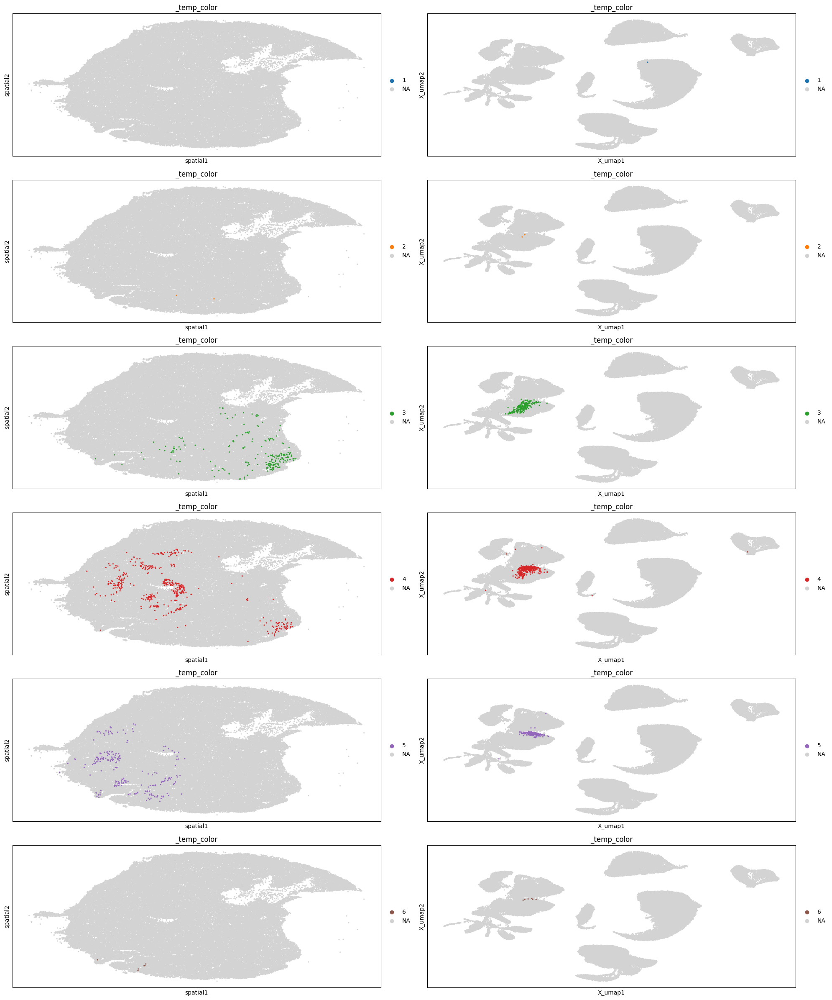



=== Mapping cell type: STRd D2 Striosome MSN using reference: STRd_D2_Striosome_MSN ===

Subsetting to STRd D2 Striosome MSN cells...
  Found 778 cells


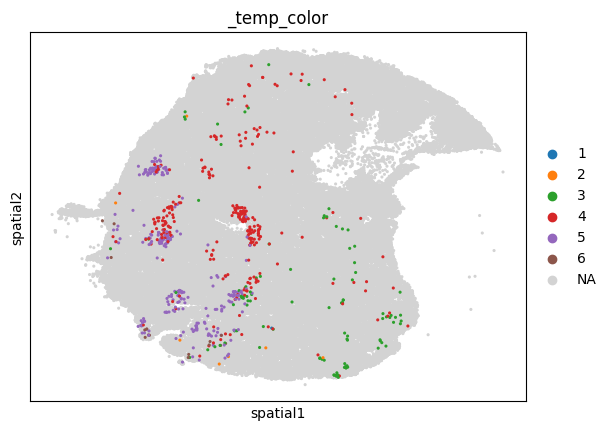

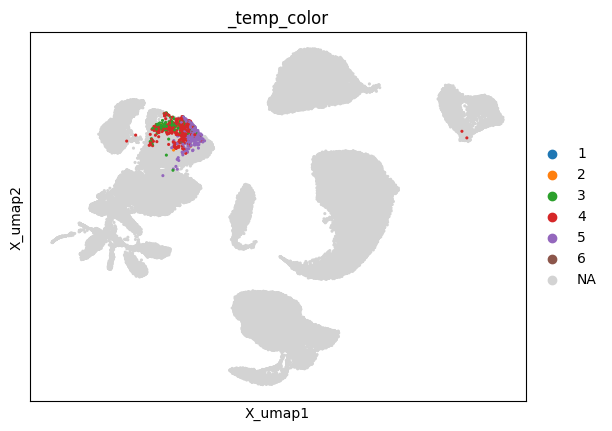

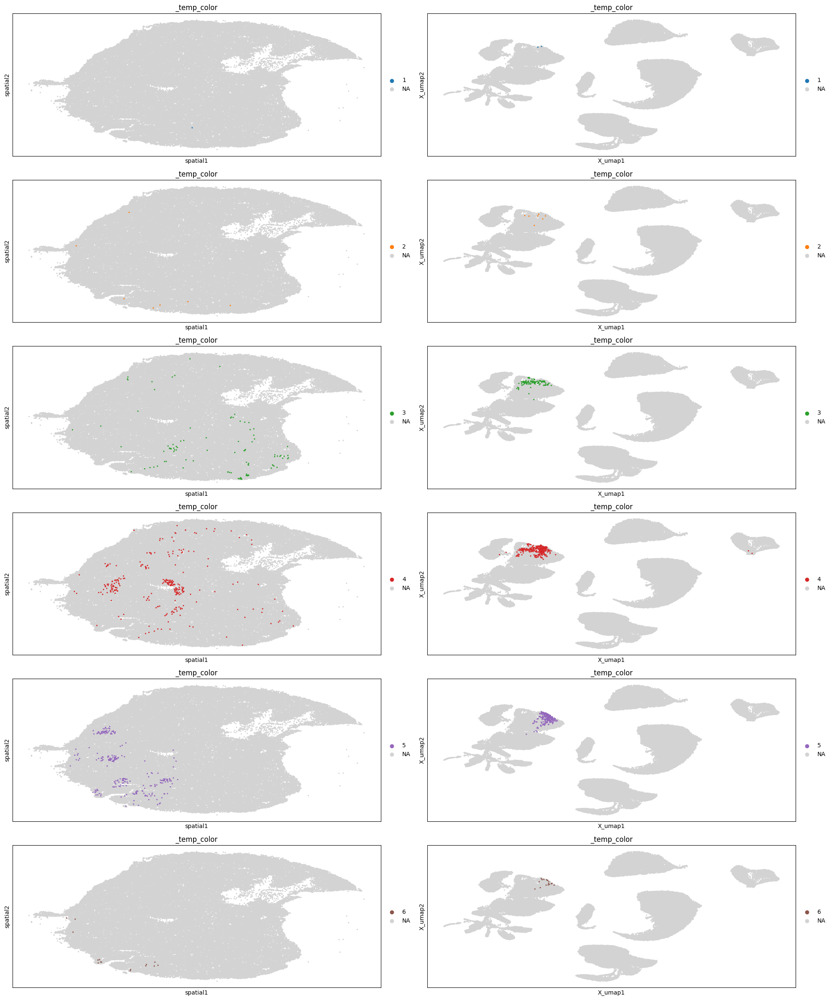



=== Mapping cell type: STRv D1 NUDAP MSN using reference: STRv_D1_NUDAP_MSN ===

Subsetting to STRv D1 NUDAP MSN cells...
  Found 2719 cells


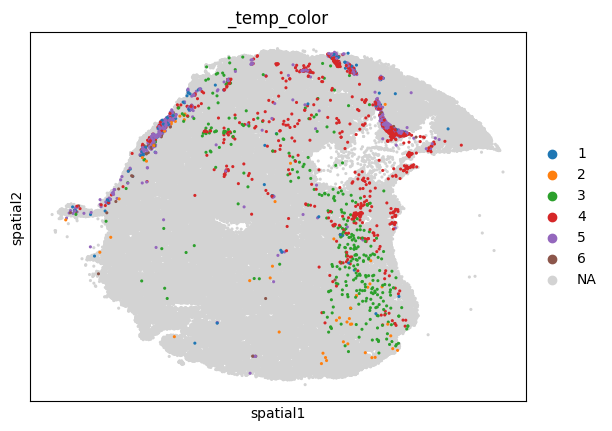

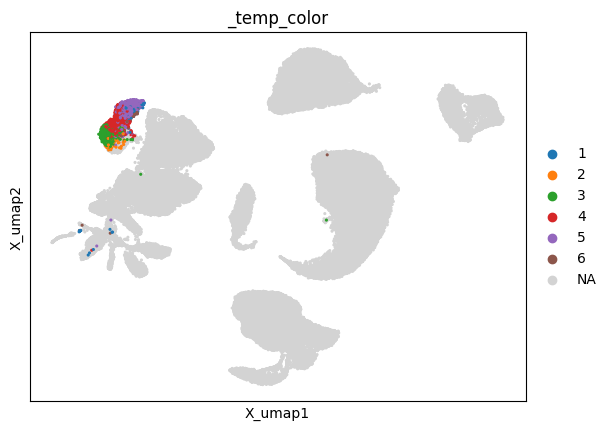

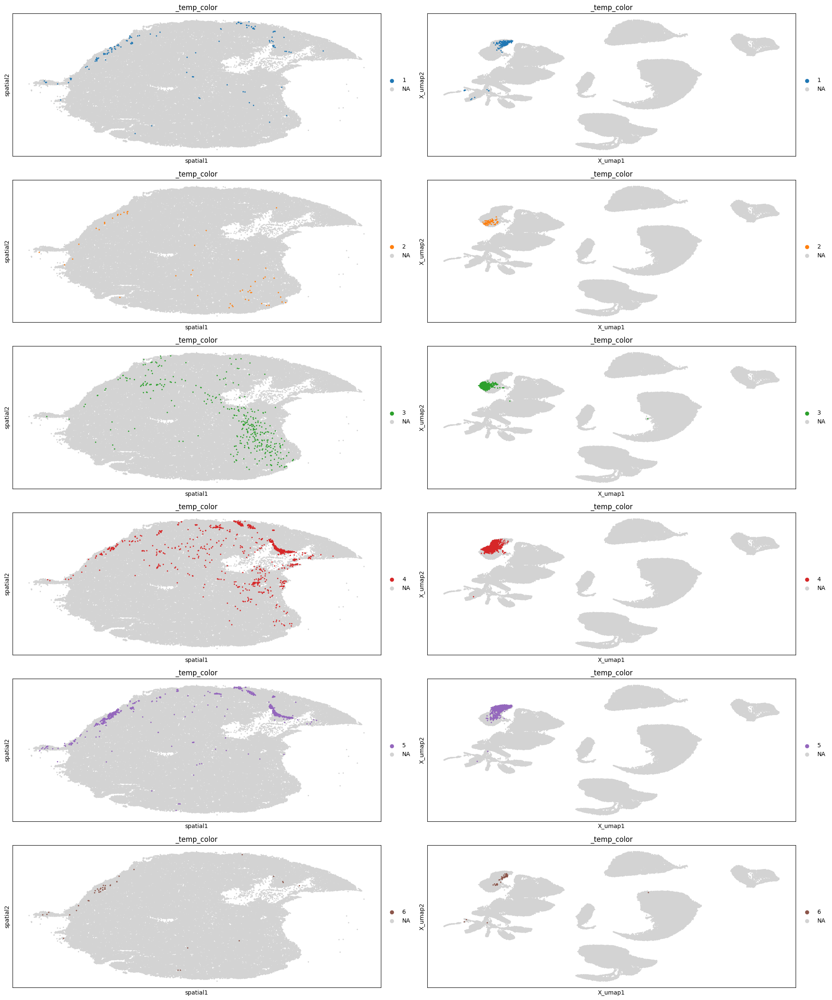



=== Mapping cell type: STR D1D2 Hybrid MSN using reference: STR_D1D2_Hybrid_MSN ===

Subsetting to STR D1D2 Hybrid MSN cells...
  Found 854 cells


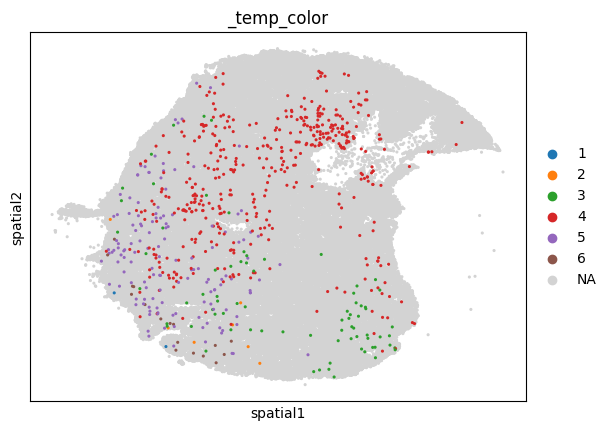

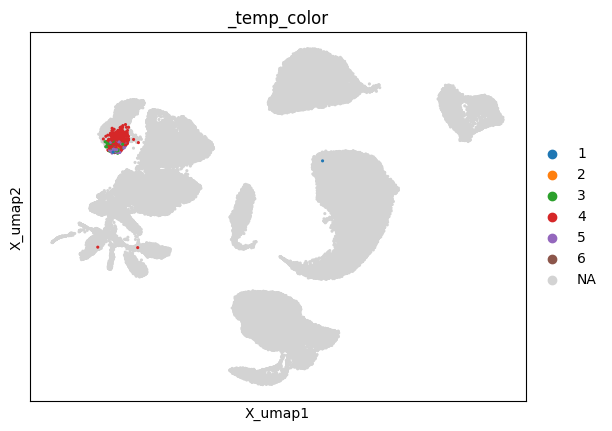

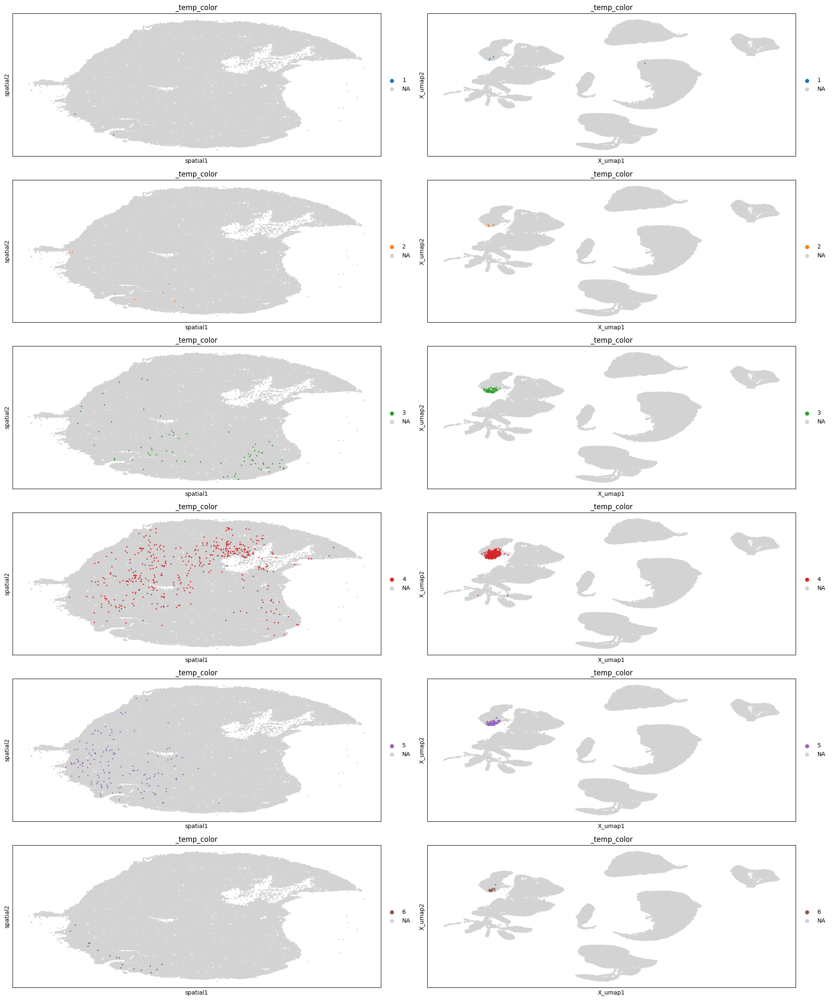



=== Mapping cell type: STRd D2 StrioMat Hybrid MSN using reference: STRd_D2_StrioMat_Hybrid_MSN ===

Subsetting to STRd D2 StrioMat Hybrid MSN cells...
  Found 594 cells


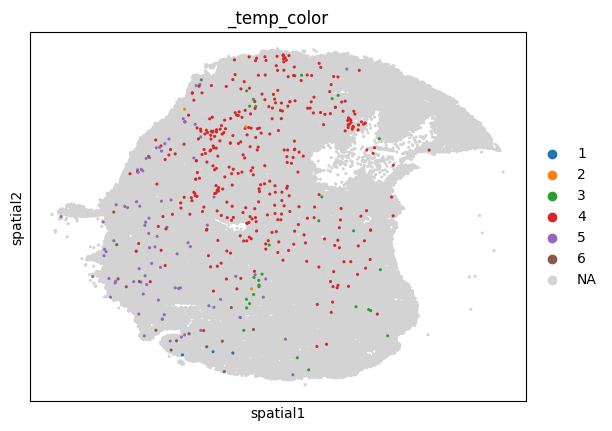

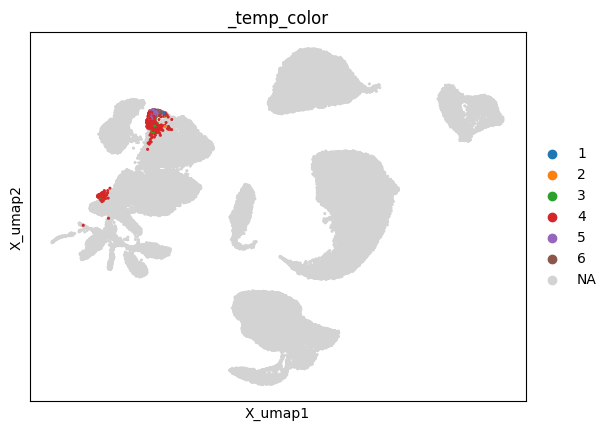

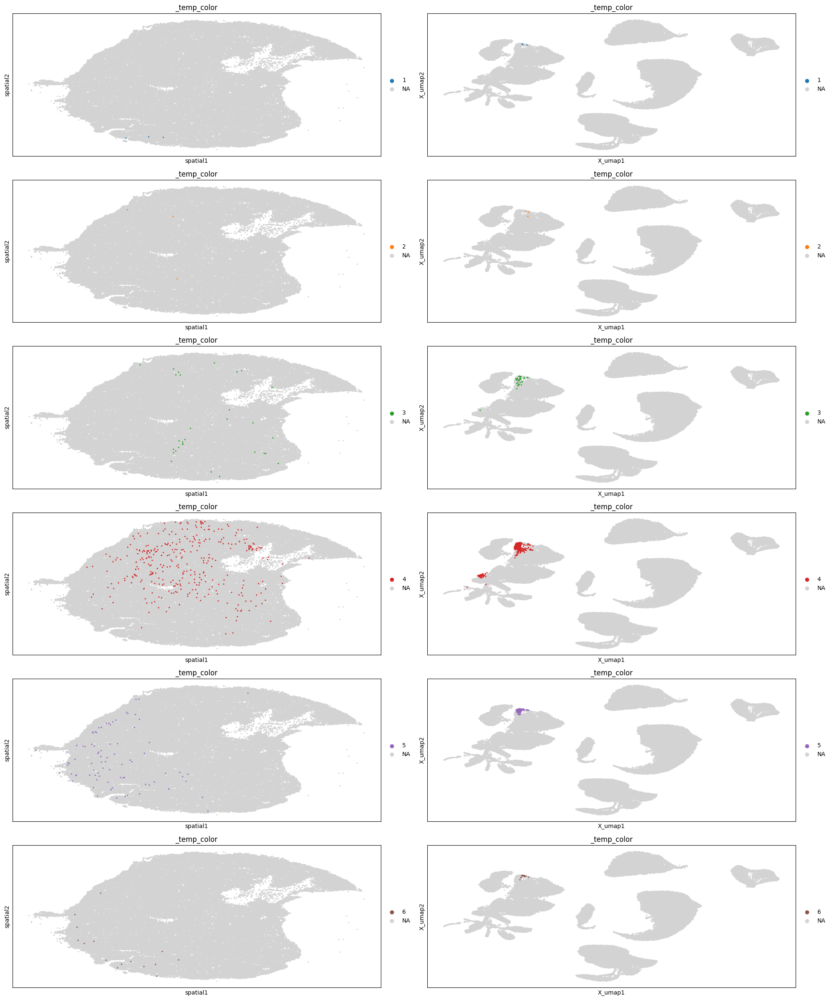



=== Mapping cell type: OPC using reference: OPC ===

Subsetting to OPC cells...
  Found 4810 cells
No zones found for OPC. Skipping visualization.


=== Mapping cell type: Astrocyte using reference: Astrocyte ===

Subsetting to Astrocyte cells...
  Found 14949 cells


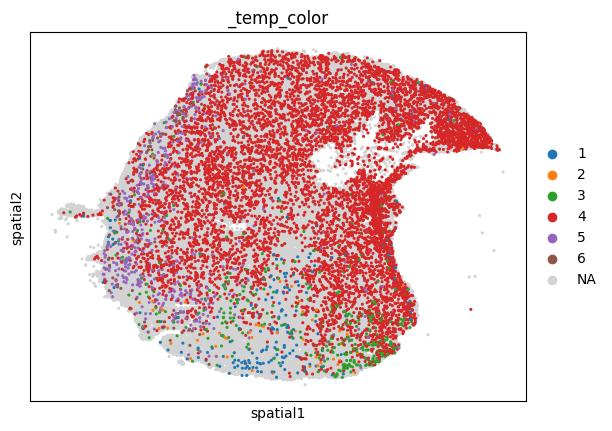

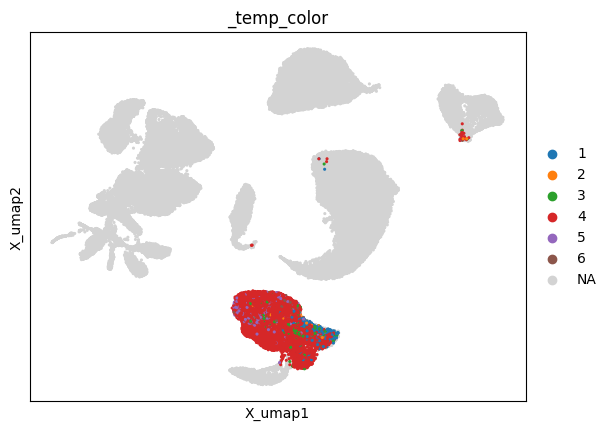

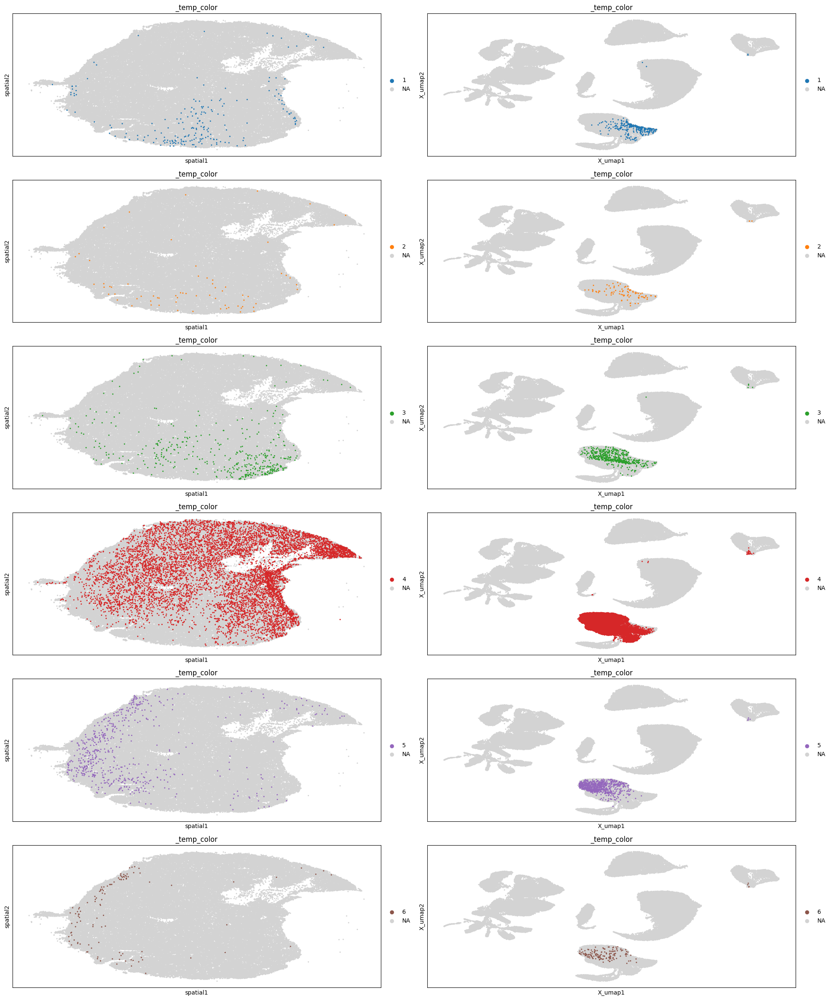

In [ ]:
# Loop through each cell type
for CT_QUERY_NAME, CT_REFERENCE_NAME in CELL_TYPE_MAPPING.items():

    print(f"\n\n=== Mapping cell type: {CT_QUERY_NAME} using reference: {CT_REFERENCE_NAME} ===")

    # Subset to cells of interest
    print(f"\nSubsetting to {CT_QUERY_NAME} cells...")
    adata_ct = query[query.obs[CT_GROUPING_TO_MAP] == CT_QUERY_NAME].copy()
    print(f"  Found {adata_ct.n_obs} cells")

    # Get zones (remove NaN)
    zones = adata_ct.obs["zone"].dropna().sort_values().unique().tolist()

    if len(zones) == 0:
        print(f"No zones found for {CT_QUERY_NAME}. Skipping visualization.")
        continue

    # sc.pl.embedding(adata_ct, basis="spatial", color="zone", size=10, palette=palette)
    # sc.pl.embedding(adata_ct, basis="X_umap", color="zone", size=10, palette=palette)

    plot_celltype_colored(query, CT_GROUPING_TO_MAP, CT_QUERY_NAME, "zone", basis="spatial")#, ax=axes[0], show=False)
    plot_celltype_colored(query, CT_GROUPING_TO_MAP, CT_QUERY_NAME, "zone", basis="X_umap")#, ax=axes[0], show=False)


    # Plot each zone
    fig, axes = plt.subplots(len(zones), 2, figsize=(20, 4 * len(zones)))
    size=30

    for i, zone in enumerate(zones):

        # Plot
        # sc.pl.embedding(adata_ct, basis="spatial", color="zone", size=size, 
        #                 palette=palette, groups=[zone], ax=axes[i, 0], show=False)
        # sc.pl.umap(adata_ct, color="zone", size=size, palette=palette, 
        #             groups=[zone], ax=axes[i, 1], show=False)
        
        plot_celltype_colored(query, CT_GROUPING_TO_MAP, CT_QUERY_NAME, "zone", groups=[zone], basis="spatial", ax=axes[i, 0], show=False)
        plot_celltype_colored(query, CT_GROUPING_TO_MAP, CT_QUERY_NAME, "zone", groups=[zone], basis="X_umap", ax=axes[i, 1], show=False)


    plt.tight_layout()
    plt.show()


# D1 MAtrix Markers

Markers from Matthiew image

[301. 171. 130. 175. 325. 164. 383. 241. 336. 260. 231. 227. 290. 277.
 306. 253. 173. 313. 398. 307. 383. 285. 224. 211. 234. 198. 214. 241.
 226. 318. 300. 162. 321. 179. 303. 424. 244. 329. 321. 286. 123. 213.
 236. 317. 185. 216. 245. 139.  77. 203. 335. 144. 283. 209. 225. 380.
 379. 208. 255. 199. 336.  82. 201. 257. 162. 229. 299. 189. 211. 362.
 311.  90. 208. 189. 352. 293. 381. 314. 153. 237. 285. 408. 340. 287.
 186. 292. 268. 234. 199. 185. 259. 322. 162. 178. 198. 270. 257. 142.
 166. 186.]
19


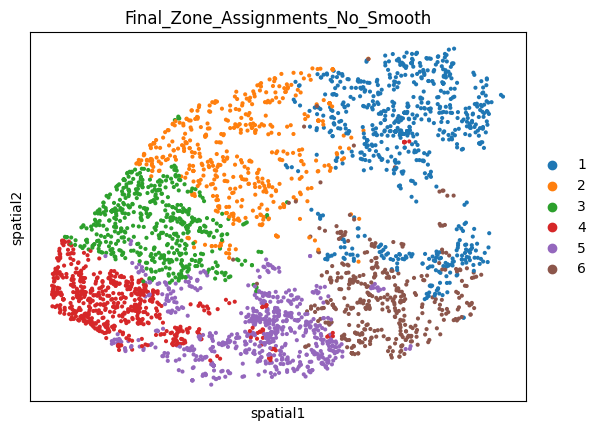

In [ ]:
reference_d1_matrix = sc.read_h5ad("/home/gdallagl/myworkdir/XDP/data/STR_zonation_references_h5ad/STR_D1_Matrix_MSN.h5ad", backed="r")
reference_d1_matrix
print(reference_d1_matrix.X[:100, :100].toarray().sum(axis=1))

# Create spatial matrix with NaN by default
spatial_coords = np.full((reference_d1_matrix.n_obs, 2), np.nan)
# For cells with has_spatial == True, add their real coordinates
mask = reference_d1_matrix.obs.x.notna() & reference_d1_matrix.obs.y.notna()
spatial_coords[mask] = reference_d1_matrix.obs.loc[mask, ['x', 'y']].values
# Assign to obsm
reference_d1_matrix.obsm['spatial'] = spatial_coords

reference_d1_matrix.var["gene_symbol"] = reference_d1_matrix.var_names

ref_samples = reference_d1_matrix.obs["donor_id"].unique()
print(len(ref_samples))
reference_d1_matrix_single_sample = reference_d1_matrix[reference_d1_matrix.obs["donor_id"] == ref_samples[0]].to_memory().copy()
sc.pl.embedding(reference_d1_matrix_single_sample, basis="spatial", color=ZONE_LABELS_COL_NAME_IN_REF)

/tmp/ipykernel_227644/2089554759.py:9: ImplicitModificationWarning: Setting element `.obsm['spatial']` of view, initializing view as actual.
  query_D1_Matrix.obsm["spatial"] = query_D1_Matrix.obsm["spatial"] @ rot.T


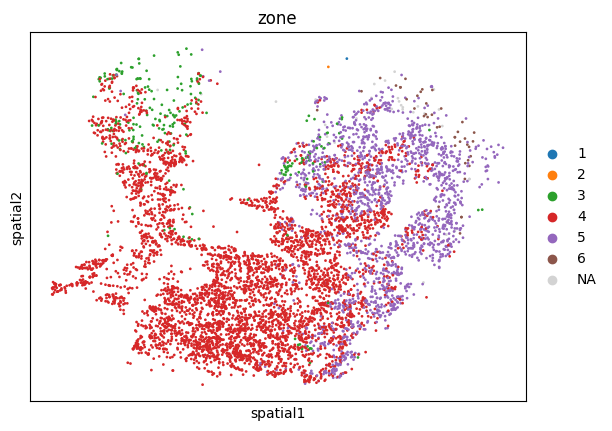

In [ ]:
query=sc.read_h5ad(FINAL_ADATA_PATH, backed="r")
query_D1_Matrix = query[query.obs[CT_GROUPING_TO_MAP] == "STR D1 Matrix MSN"].to_memory().copy()
query_D1_Matrix = query_D1_Matrix[query_D1_Matrix.obs["Group_name"] != "Tafa1 D1 Matrix MSN"]

theta = np.radians(180)  # change angle as needed
rot = np.array([[np.cos(theta), -np.sin(theta)],
                [np.sin(theta),  np.cos(theta)]])

query_D1_Matrix.obsm["spatial"] = query_D1_Matrix.obsm["spatial"] @ rot.T

sc.pl.embedding(query_D1_Matrix, basis="spatial", color="zone")

In [ ]:
# Process
query_D1_Matrix.X = query_D1_Matrix.layers["counts"]
preprocessing.preprocess(query_D1_Matrix, save_scaled=True)

preprocessing.preprocess(reference_d1_matrix_single_sample, save_scaled=True, save_raw_counts=True)

Expect .X is raw counts!
Normalizing...
Findingn HVGs...
Scaling...


/home/gdallagl/.pyenv/versions/3.11.8/lib/python3.11/functools.py:909: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)


Calculating PCA...
Calculating neighbors...
Calculating Umap...
Clutering...
Preprocessing done.
Expect .X is raw counts!
Normalizing...
Findingn HVGs...
Scaling...


/home/gdallagl/.pyenv/versions/3.11.8/lib/python3.11/functools.py:909: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)


Calculating PCA...
Calculating neighbors...
Calculating Umap...
Clutering...
Preprocessing done.


In [ ]:
# coords = query_D1_Matrix.obsm["spatial"].copy()

# y_max = np.nanmax(coords[:, 1])
# coords[:, 1] = y_max - coords[:, 1]

# query_D1_Matrix.obsm["spatial"] = coords

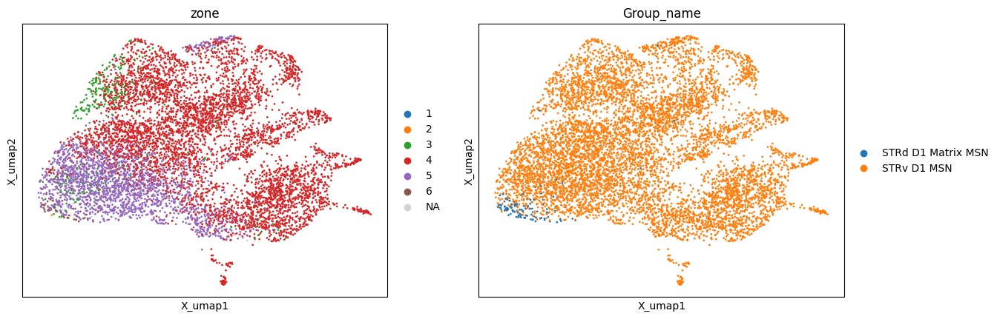

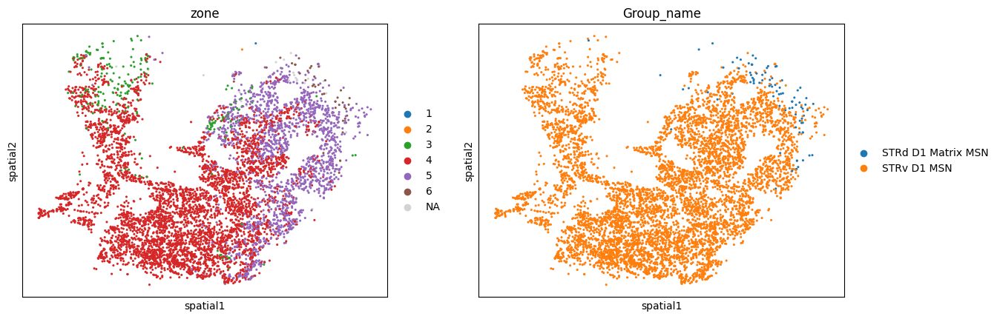

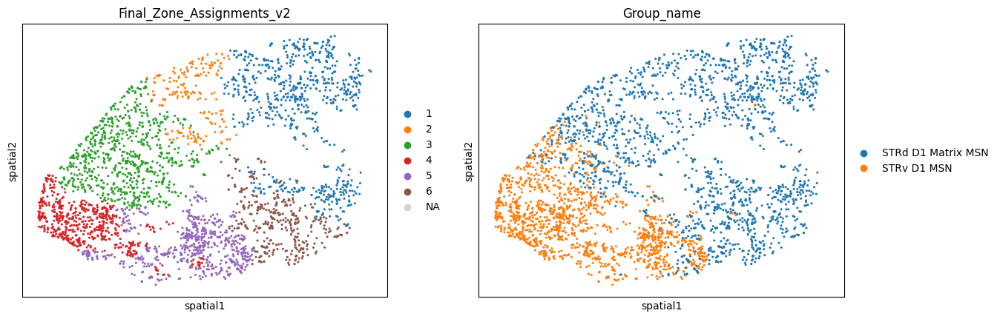

In [ ]:
to_plot=["zone", "Group_name",]# f"{OBS_COL_ZONE}_probability" ]
sc.pl.embedding(query_D1_Matrix, basis="X_umap", color=to_plot, color_map="copper", vmin=0.5)
sc.pl.embedding(query_D1_Matrix, basis="spatial", color=to_plot, size=20, color_map="copper", vmin=0.5)
sc.pl.embedding(reference_d1_matrix_single_sample, basis="spatial", color=[ZONE_LABELS_COL_NAME_IN_REF, "Group_name"], size=20, color_map="copper", vmin=0.5)

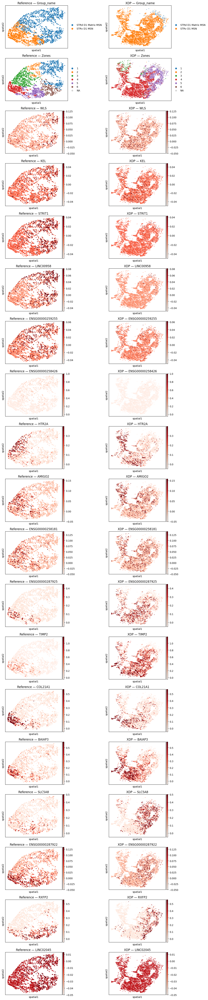

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import scanpy as sc
import ast, os

zone_markers_dict = ast.literal_eval(os.getenv("ZONE_MARKERS_D1_MATRIX"))
all_genes = [gene for genes in zone_markers_dict.values() for gene in genes]

LAYER = "log1p_norm"
CMAP = "Reds"
PERCENTILE = 95
VMIN = -0.05

n_rows = 2 + len(all_genes)  # Group_name + zones + genes
fig, axes = plt.subplots(n_rows, 2, figsize=(12, 3 * n_rows))

# Row 0: Group_name
sc.pl.embedding(reference_d1_matrix_single_sample, basis="spatial", color="Group_name",
                ax=axes[0, 0], show=False, title="Reference — Group_name")
sc.pl.embedding(query_D1_Matrix, basis="spatial", color="Group_name",
                ax=axes[0, 1], show=False, title="XDP — Group_name")

# Row 1: zone labels
sc.pl.embedding(reference_d1_matrix_single_sample, basis="spatial", color=ZONE_LABELS_COL_NAME_IN_REF,
                ax=axes[1, 0], show=False, title="Reference — Zones")
sc.pl.embedding(query_D1_Matrix, basis="spatial", color="zone",
                ax=axes[1, 1], show=False, title="XDP — Zones")

# Remaining rows: gene expression
for i, gene in enumerate(all_genes):
    ref_vals = reference_d1_matrix_single_sample[:, reference_d1_matrix_single_sample.var["gene_symbol"] == gene].layers[LAYER].toarray().flatten()
    query_vals = query_D1_Matrix[:, query_D1_Matrix.var["gene_symbol"] == gene].layers[LAYER].toarray().flatten()
    vmax = np.nanpercentile(np.concatenate([ref_vals, query_vals]), PERCENTILE)
    if vmax == 0:
        vmax = 1

    sc.pl.embedding(reference_d1_matrix_single_sample, basis="spatial", color=gene,
                    layer=LAYER, gene_symbols="gene_symbol", color_map=CMAP,
                    vmin=VMIN, vmax=vmax, ax=axes[i + 2, 0], show=False, title=f"Reference — {gene}")
    sc.pl.embedding(query_D1_Matrix, basis="spatial", color=gene,
                    layer=LAYER, gene_symbols="gene_symbol", color_map=CMAP,
                    vmin=VMIN, vmax=vmax, ax=axes[i + 2, 1], show=False, title=f"XDP — {gene}")

plt.tight_layout()
plt.show()

Assure that adata.var.index has same gene name of makers...


  0%|          | 0/6 [00:00<?, ?it/s]

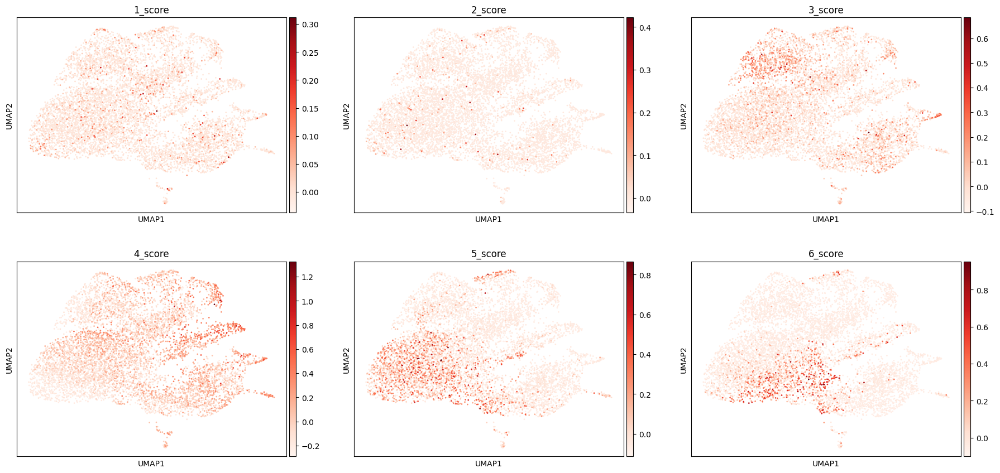

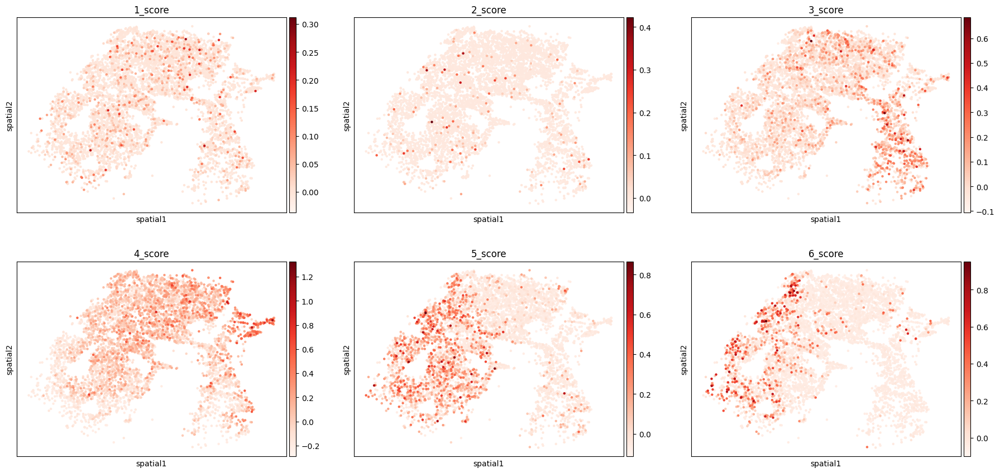

['1_score', '2_score', '3_score', '4_score', '5_score', '6_score']

In [ ]:
# Plot cell type zone markers
preprocessing.calculate_and_plot_markers(query_D1_Matrix, zone_markers_dict, ncol=3, layer="log1p_norm", gene_col="gene_symbol", color_map="Reds")

# Save Notebook

In [ ]:
# Get the notebook path
notebook_path = str(ipynbname.path())
print(f"Current notebook: {notebook_path}")

# Save it
base_name = os.path.basename(notebook_path).replace('.ipynb', '')  # Remove .ipynb
saving_path = f"{BASE_PATH}/{DISEASE_TYPE}/{SAMPLE_ID}/notebooks/{base_name}_{SAMPLE_ID}.ipynb"
print(f"Saved to {saving_path}")

print("\n   Press Ctrl+S")

Current notebook: /home/gdallagl/myworkdir/XDP/script/single_sample_analysis-Slide_tag/06_zone_labelling.ipynb
Saved to /home/gdallagl/myworkdir/data/XDP/diseased/sample_01/notebooks/06_zone_labelling_sample_01.ipynb

   Press Ctrl+S


In [ ]:
shutil.copy(notebook_path, saving_path)

'/home/gdallagl/myworkdir/data/XDP/diseased/sample_01/notebooks/06_zone_labelling_sample_01.ipynb'